In [1]:
import pertpy as pt
import pickle as pkl
import scanpy as sc
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
import seaborn as sns
from scipy import stats
from scipy import sparse 
from statsmodels.sandbox.stats.multicomp import multipletests


Installed version 0.4.0 of pertpy is outdated. Newest version is 0.5.0!

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [2]:
%load_ext autoreload
%autoreload 2

import importlib
importlib.reload(pt)

Installed version 0.4.0 of pertpy is outdated. Newest version is 0.5.0!

<module 'pertpy' from '/Users/tessa/miniforge3/envs/pertpy5/lib/python3.9/site-packages/pertpy/__init__.py'>

In [3]:
def test_association(adata, celltype_label = "Cluster", sample_label="Sample", condition_label = "Efficacy", conditions_compare = ("PR","SD")): 
    pvals = pd.DataFrame(1, adata.obs[celltype_label].unique().tolist(), ["mcp_"+str(n) for n in range(0,10)])
    tstats = pd.DataFrame(1, adata.obs[celltype_label].unique().tolist(), ["mcp_"+str(n) for n in range(0,10)])
    response = adata.obs.groupby(sample_label)[condition_label].agg(pd.Series.mode)
    res = dict()
    for celltype in adata.obs[celltype_label].unique().tolist():
        df = adata.obs[adata.obs[celltype_label]==celltype]

        for mcpnum in ["mcp_"+str(n) for n in range(0,10)]:
            mns = df.groupby(sample_label)[mcpnum].mean()
            mns = pd.concat([mns,response],axis=1)
            res = stats.ttest_ind(mns[mns[condition_label]==conditions_compare[0]][mcpnum],mns[mns[condition_label]==conditions_compare[1]][mcpnum])
            pvals.loc[celltype, mcpnum]=res[1]
            tstats.loc[celltype, mcpnum]=res[0]
    return pvals,tstats

In [4]:
def plot_split_violins(adata, mcp = "mcp_0", split="Efficacy", celltype_key = "Cluster"):
    df = sc.get.obs_df(adata, [celltype_key,mcp, split])
  

    p2 = sns.violinplot(data=df, x=celltype_key,y=mcp,hue=split, split=True)
    p2.set_xticklabels(p2.get_xticklabels(), rotation=45)


In [5]:
def mcp_pairsplot(adata, celltype_key = "Cluster", color = "Efficacy", mcp = "mcp_0", sample_key = "Sample"):
    mean_mcps = adata.obs.groupby([sample_key,celltype_key])[mcp].mean()
    mean_mcps = mean_mcps.reset_index()
    mcp_pivot = pd.pivot(mean_mcps[[sample_key,celltype_key,mcp]],index=sample_key,columns = celltype_key )[mcp]
    mcp_pivot = pd.concat([mcp_pivot,adata.obs.groupby([sample_key]).agg(pd.Series.mode)[color]],axis=1)
    sns.pairplot(mcp_pivot, corner=True, hue=color)
    

In [28]:
adata = sc.read_h5ad("zhang_with_PCs.h5ad")

In [29]:
adata

AnnData object with n_obs × n_vars = 489490 × 4000
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [30]:
# tumor samples only
adata = adata[adata.obs['Origin']=="t" ,:].copy()

In [31]:
# pre-treatment samples only 
adata = adata[adata.obs['Sample'].str.contains('Pre'),:].copy()

In [32]:
# isecs = adata.obs.groupby(["Cluster", "Sample"]).size()
isecs = pd.crosstab(adata.obs['Cluster'], adata.obs['Sample'])

(array([ 5.,  8.,  6.,  1.,  8.,  3., 10.,  4.,  7.,  5.]),
 array([ 0. ,  1.5,  3. ,  4.5,  6. ,  7.5,  9. , 10.5, 12. , 13.5, 15. ]),
 <BarContainer object of 10 artists>)

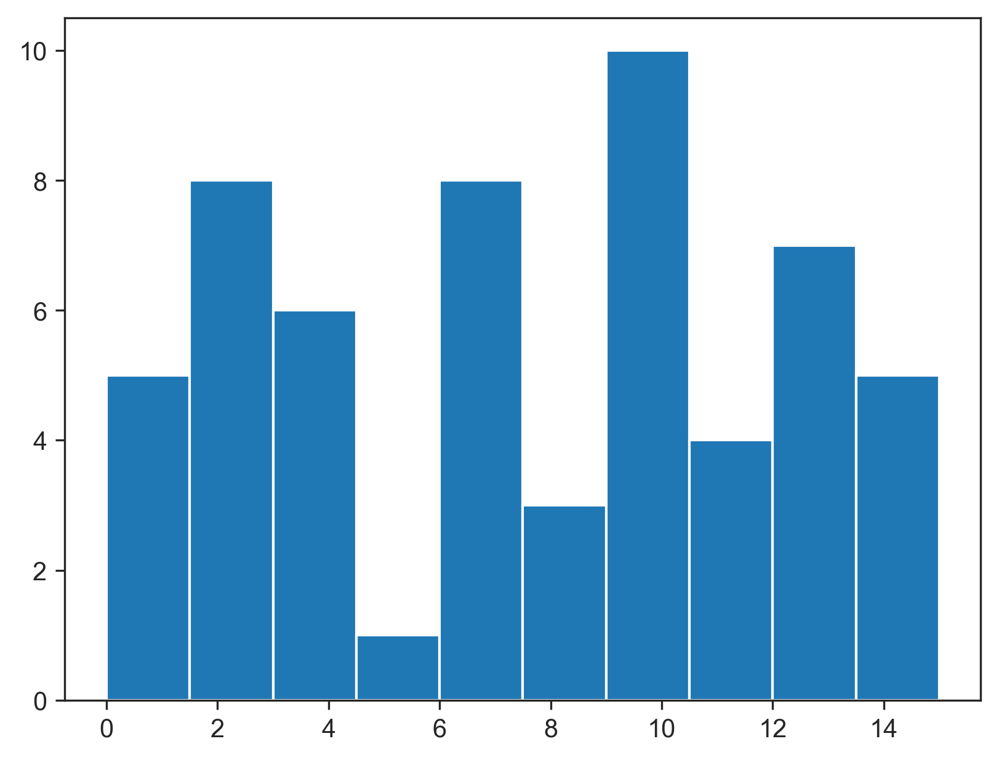

In [33]:
plt.hist((isecs >3).sum(axis=1))

In [34]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]]

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_pB-IGHG1,679,8,12,12,4,301,4,136,14,238,1753,911,1083,206,283


In [35]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]-1]

# drop sample Pre_P010_t 

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_CD4_Tcm-LMNA,4,392,569,249,0,288,6,311,20,134,555,77,593,444,87
t_CD4_Treg-FOXP3,13,338,110,62,0,464,24,419,17,518,769,743,398,122,130
t_CD8_Tem-GZMK,8,957,368,72,0,417,17,176,21,154,2354,202,709,891,292
t_Tn-LEF1,11,98,110,3494,0,1269,22,50,609,167,4010,175,1501,388,271


In [36]:
isecs[(isecs > 3).sum(axis=1) == np.shape(isecs)[1]-2]
# drop Pre_P013_t, Pre_P017_t, Pre_P002_2

Sample,Pre_P002_t,Pre_P004_t,Pre_P005_t,Pre_P007_t,Pre_P010_t,Pre_P012_t,Pre_P013_t,Pre_P016_t,Pre_P017_t,Pre_P018_t,Pre_P019_t,Pre_P020_t,Pre_P022_t,Pre_P023_t,Pre_P025_t
Cluster,,,,,,,,,,,,,,,
t_Bmem-CD27,377,11,12,105,0,1950,0,11,166,22,4210,132,309,121,400
t_CD8_MAIT-KLRB1,0,51,1244,45,0,40,7,84,24,19,67,14,38,20,11
t_CD8_Trm-ZNF683,3,76,180,71,0,143,4,407,4,226,422,121,449,219,150
t_mono-FCN1,4,60,11,12,0,14,23,44,1,31,43,15,51,33,16


In [37]:
celltypes = isecs[(isecs > 3).sum(axis=1) >= np.shape(isecs)[1]-2].index.values.to_list()

In [38]:
# subset to cell types with sufficient expression
adata = adata[adata.obs['Cluster'].isin(celltypes),:].copy()

In [39]:
adata

AnnData object with n_obs × n_vars = 44636 × 4000
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [40]:
isecs = pd.crosstab(adata.obs['Cluster'], adata.obs['Sample'])

In [41]:
keep_pts = isecs.loc[:,(isecs > 3).sum(axis=0) == isecs.shape[0]].columns.values.to_list()

In [42]:
adata = adata[adata.obs['Sample'].isin(keep_pts),:].copy()

In [43]:
pd.crosstab(adata.obs['Cluster'], adata.obs['Sample']).min(axis=1)

Cluster
t_Bmem-CD27         11
t_CD4_Tcm-LMNA      77
t_CD4_Treg-FOXP3    62
t_CD8_MAIT-KLRB1    11
t_CD8_Tem-GZMK      72
t_CD8_Trm-ZNF683    71
t_Tn-LEF1           50
t_mono-FCN1         11
t_pB-IGHG1           8
dtype: int64

In [44]:
pd.crosstab(adata.obs['Cluster'], adata.obs['Sample']).min(axis=0)

Sample
Pre_P004_t     8
Pre_P005_t    11
Pre_P007_t    12
Pre_P012_t    14
Pre_P016_t    11
Pre_P018_t    19
Pre_P019_t    43
Pre_P020_t    14
Pre_P022_t    38
Pre_P023_t    20
Pre_P025_t    11
dtype: int64

In [45]:
# cell counts look passable (though definitely low for some -- could consider dropping more things)

In [54]:
adata

AnnData object with n_obs × n_vars = 42550 × 4000
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [23]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

# I think this stage may be re-running PCA??

In [26]:
adata

AnnData object with n_obs × n_vars = 42550 × 4000
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [24]:
adata.obs.columns

Index(['Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group',
       'Treatment', 'Number of counts', 'Number of genes', 'Major celltype',
       'Cluster'],
      dtype='object')

In [32]:
adata_plot = sc.pp.subsample(adata,  n_obs=10000, random_state=0, copy=True)

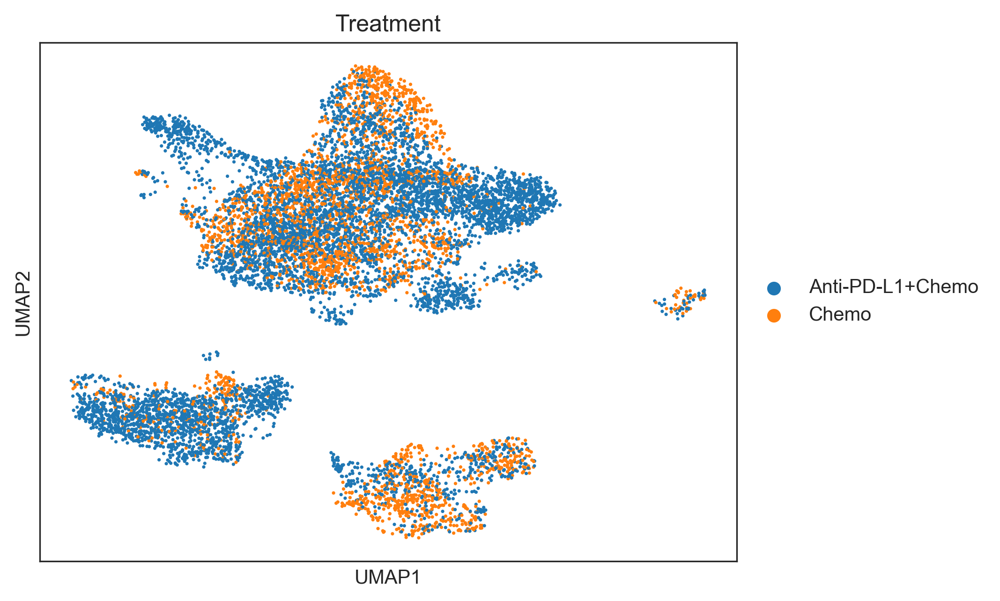

In [33]:
sc.pl.umap(
    adata_plot,
    color=[
        "Treatment"
    ],
)


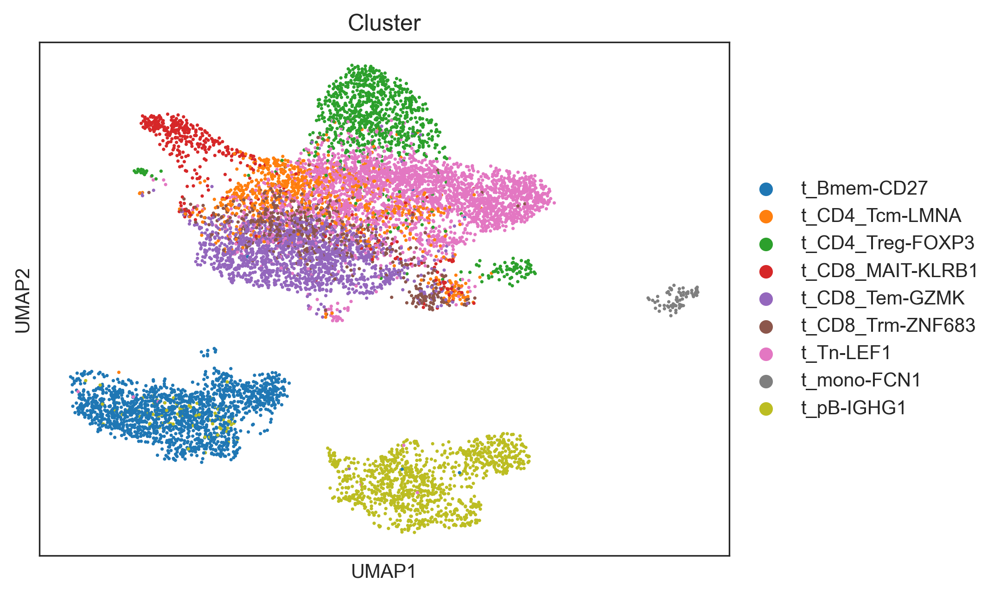

In [34]:
sc.pl.umap(
    adata_plot,
    color=[
        "Cluster"
    ],
)

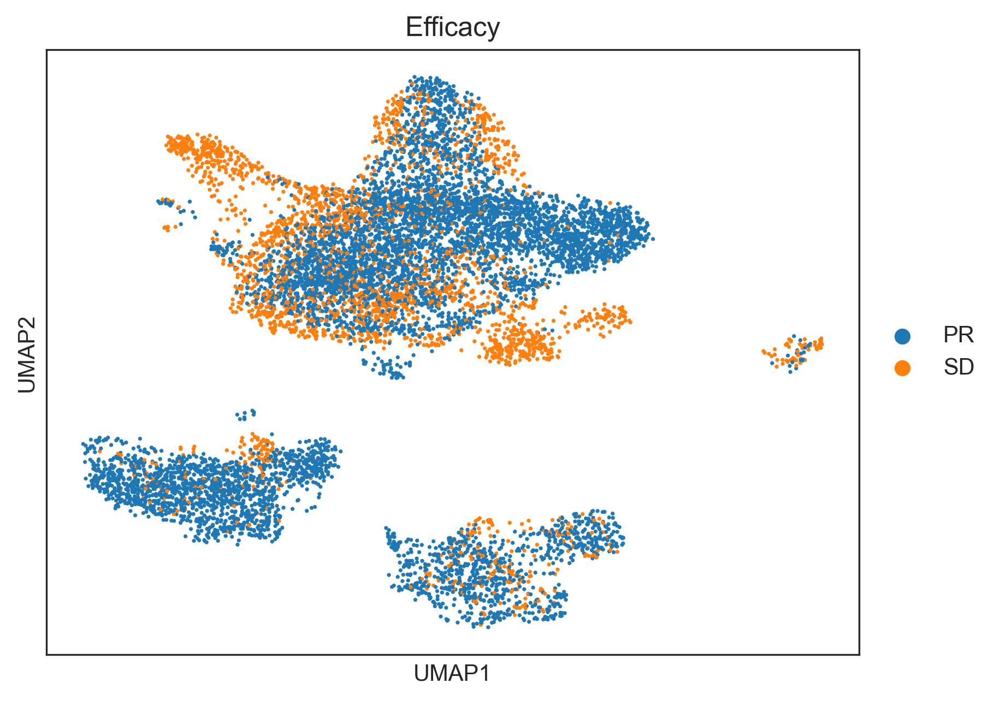

In [35]:
sc.pl.umap(
    adata_plot,
    color=[
        "Efficacy"
    ],
)

In [56]:
adata_lp = adata.copy()

dl_lp = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_lp, mcps_lp, ws_lp, ct_subs_lp = dl_lp.calculate_multifactor_PMD(
    adata_lp,
    normalize=True,
    solver="lp"
)

#adata, mcps, ws, ct_subs = dl.calculate_multifactor_PMD(
#    adata,
#    groupby='Sample',
#    celltype_key='Cluster',
#    mimic_dialogue=True,
#    n_components=10
#)

pvals_lp, tstats_lp = test_association(adata_lp)

In [37]:
pvals_lp.min()

mcp_0    0.148392
mcp_1    0.142909
mcp_2    0.138914
mcp_3    0.135653
mcp_4    0.133086
mcp_5    0.130999
mcp_6    0.099959
mcp_7    0.050454
mcp_8    0.033683
mcp_9    0.028501
dtype: float64

In [57]:
adata_lp

AnnData object with n_obs × n_vars = 42550 × 4000
    obs: 'Sample', 'Patient', 'Origin', 'Tissue', 'Efficacy', 'Group', 'Treatment', 'Number of counts', 'Number of genes', 'Major celltype', 'Cluster', 'mcp_0', 'mcp_1', 'mcp_2', 'mcp_3', 'mcp_4', 'mcp_5', 'mcp_6', 'mcp_7', 'mcp_8', 'mcp_9'
    obsm: 'X_pca'

In [38]:
adata_bs = adata.copy()

dl_bs = pt.tl.Dialogue(sample_id = "Sample",
                   celltype_key = "Cluster",
                   n_counts_key = "Number of counts",
                   n_mpcs = 10)

adata_bs, mcps_bs, ws_bs, ct_subs_bs = dl_bs.calculate_multifactor_PMD(
    adata_bs,
    normalize=True,
    solver="bs"
)

pvals_bs, tstats_bs = test_association(adata_bs)

In [39]:
pvals_bs.min()

mcp_0    0.088695
mcp_1    0.284868
mcp_2    0.149251
mcp_3    0.500112
mcp_4    0.007831
mcp_5    0.194837
mcp_6    0.311618
mcp_7    0.120504
mcp_8    0.006403
mcp_9    0.122496
dtype: float64

In [40]:

dlg_dict = {"mcps":mcps_lp, "ws":ws_lp,"ct_subs":ct_subs_lp, "pvals":pvals_lp, "tstats":tstats_lp}
outfile =  "output/tumor_pre_DLG_normalizeTrue_lpsolver_071023.pkl"
with open(outfile, 'wb') as pickle_file:
    pkl.dump(dlg_dict, pickle_file)
pickle_file.close()


In [41]:
dlg_dict = {"mcps":mcps_bs, "ws":ws_bs,"ct_subs":ct_subs_bs, "pvals":pvals_bs, "tstats":tstats_bs}
outfile =  "output/tumor_pre_DLG_normalizeTrue_bssolver_071023.pkl"
with open(outfile, 'wb') as pickle_file:
    pkl.dump(dlg_dict, pickle_file)
pickle_file.close()

In [42]:
adata_lp.write("output/tumor_pre_DLG_normalizeTrue_lpsolver_071023.h5ad")
adata_bs.write("output/tumor_pre_DLG_normalizeTrue_bssolver_071023.h5ad")

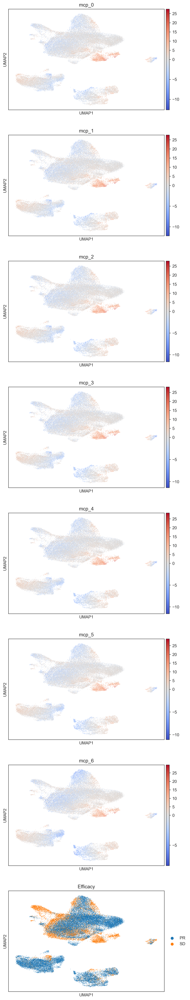

In [43]:
sc.pl.umap(adata_lp, color=["mcp_0", "mcp_1", "mcp_2","mcp_3","mcp_4","mcp_5","mcp_6","Efficacy"], ncols=1, cmap='coolwarm', vcenter=0)


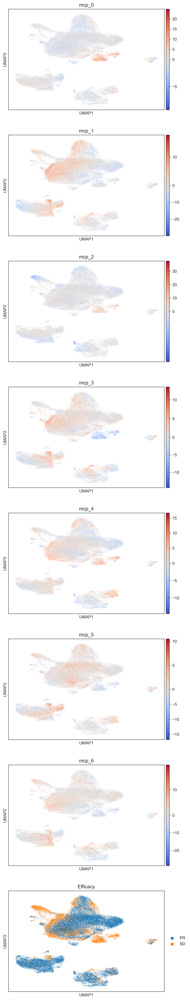

In [46]:
sc.pl.umap(adata_bs, color=["mcp_0", "mcp_1", "mcp_2","mcp_3","mcp_4","mcp_5","mcp_6","Efficacy"], ncols=1, cmap='coolwarm', vcenter=0)


In [ ]:
def project_mcps(adata, ws, celltype_label = "Cluster",obsm_key = "X_pca", remove_celltypes = True):
    """
    Project the X_pca through ws for all cells
    If cells aren't in the celltype list returns 0
    
    
    """
    adata.obs[list(range(0,10))] =0
    if set(adata.obs[celltype_label].unique().to_list())!= set(ws.keys()):
        print("cell types do not match")
    if remove_celltypes:
        adata=adata[adata.obs['Cluster'].isin(ws.keys())]
    adata.obs
    for celltype in ws.keys():
        print(celltype)
        print(np.matmul(adata[adata.obs[celltype_label]==celltype,:].obsm[obsm_key] ,ws[celltype])
        # issue here is that you're trying to set values for the whole adata
        # but you want to set them for just the cells in this celltype
        adata.obs[list(range(0,10))]=np.matmul(adata[adata.obs[celltype_label]==celltype,:].obsm[obsm_key] ,ws[celltype])
    return(adata)
        

In [ ]:
w_corrs = np.ones((10,10))
for i in range(10):
    for j in range(10):
        w_corrs[i,j]= ws_lp['t_Bmem-CD27'][:,i]@ws_lp['t_Bmem-CD27'][:,j]
w_corrs

In [ ]:
w_corrs[1:,1]

In [51]:
adata.obs['Cluster'].value_counts()

t_Tn-LEF1           11533
t_Bmem-CD27          7283
t_CD8_Tem-GZMK       6592
t_pB-IGHG1           4943
t_CD4_Treg-FOXP3     4073
t_CD4_Tcm-LMNA       3699
t_CD8_Trm-ZNF683     2464
t_CD8_MAIT-KLRB1     1633
t_mono-FCN1           330
Name: Cluster, dtype: int64

In [ ]:
w_corrs = np.ones((5,5))
for i in range(5):
    for j in range(5):
        w_corrs[i,j]= ws_bs['t_Bmem-CD27'][:,i]@ws_bs['t_Bmem-CD27'][:,j]
w_corrs


In [ ]:
w_corrs = np.ones((5,5))
for i in range(5):
    for j in range(5):
        w_corrs[i,j]= ws_lp['t_Tn-LEF1'][:,i]@ws_lp['t_Tn-LEF1'][:,j]
w_corrs


In [1]:
ws_bs.keys()

NameError: name 'ws_bs' is not defined

In [4]:
import pickle as pkl
with open("output/tumor_pre_DLG_normalizeTrue_bssolver_071023_MCPgenes_orig.pkl", 'rb') as file:
    a = pkl.load(file)
file.close()


In [11]:
a['all_results']['t_Bmem-CD27_vs_t_CD4_Tcm-LMNA']['MCP4']['sig_genes_1']

{'MCP4.up': ['AC016831.7',
  'ARID5B',
  'ATF3',
  'BAG3',
  'BASP1',
  'BCL2A1',
  'BRD2',
  'BTG1',
  'CD69',
  'CHORDC1',
  'CKS2',
  'CREM',
  'CTSZ',
  'CXCR5',
  'DDX3X',
  'DDX5',
  'DNAJA1',
  'DNAJB1',
  'DNAJB4',
  'DNAJB6',
  'DUSP1',
  'DUSP4',
  'DUSP5',
  'EGR1',
  'EGR4',
  'ELF1',
  'FAM177A1',
  'FCRL2',
  'FOS',
  'FOSB',
  'FOSL2',
  'GADD45B',
  'GNG2',
  'GPR18',
  'H2AFX',
  'H2AFZ',
  'H3F3B',
  'HERPUD1',
  'HIST1H4C',
  'HLA-DQA1',
  'HSP90AA1',
  'HSP90AB1',
  'HSPA1A',
  'HSPA1B',
  'HSPA6',
  'HSPA8',
  'HSPB1',
  'HSPD1',
  'HSPE1',
  'HSPH1',
  'ICAM1',
  'IER2',
  'IER5',
  'IFRD1',
  'IGLC2',
  'IGLV3-1',
  'IGLV3-9',
  'JUN',
  'MT-ATP8',
  'NAMPT',
  'NEAT1',
  'NEU1',
  'NFATC2',
  'NFKB1',
  'NFKBID',
  'NFKBIZ',
  'NR4A1',
  'NR4A2',
  'PIM3',
  'PLK2',
  'PMAIP1',
  'PNRC1',
  'PPP1R15A',
  'RASGEF1B',
  'REL',
  'RGCC',
  'RGS1',
  'RGS2',
  'RHOB',
  'SERTAD1',
  'SFPQ',
  'SLC38A2',
  'SNHG12',
  'SOD2',
  'SRSF7',
  'SWAP70',
  'TAGAP',
  'TIPA

In [15]:
a['all_results']['t_Bmem-CD27_vs_t_CD4_Tcm-LMNA']['MCP4']['sig_genes_2']['MCP4.down']

['ACTG2',
 'ATF3',
 'BGN',
 'CALD1',
 'CD24',
 'COL1A1',
 'CRABP1',
 'CRYAB',
 'DDIT3',
 'FDCSP',
 'FXYD3',
 'GADD45B',
 'GADD45G',
 'GAPDH',
 'H2AFX',
 'ID2',
 'IER2',
 'IER3',
 'IFI27',
 'IFITM1',
 'IGFBP5',
 'JUND',
 'KRT14',
 'KRT15',
 'KRT16',
 'KRT19',
 'KRT8',
 'KRT81',
 'LY6E',
 'MMP7',
 'MT-ATP8',
 'MTRNR2L12',
 'NFKBIA',
 'NFKBIZ',
 'PHLDA1',
 'PMAIP1',
 'RASD1',
 'RPS29',
 'S100A1',
 'S100A10',
 'S100A11',
 'S100A14',
 'SLC38A2',
 'SNHG12',
 'SPARC',
 'SRSF7',
 'STAT1',
 'TM4SF1',
 'TNF',
 'TPM2',
 'TSPYL2',
 'TUBB4B']